# Accident Dataset Analysis

According to the [WHO](https://www.who.int/news-room/fact-sheets/detail/road-traffic-injuries), 1.19 million people lose their lives every year to road accidents, which is the leading cause of death for people aged 5 - 29, half of who are vulnerable road users like pedestrians and cyclists. Many more are left disabled and unable to continue with their day to day lives normally, affecting their social, and financial lives.

In this project, we conduct the analysis of a dataset from [kaggle](https://www.kaggle.com/datasets/xavierberge/road-accident-dataset) on accidents happening in an unamed area, containing the road type of injury, type of vehicle involved in accident, type of road, type of geographical area, time of the day and road conditions. From it we aim to gain insight on this matter.

## Objectives of the project (Research Questions)

From the project I aim to:
- Study trends of accidents over the period in which the data was collected
- Find the most common location where accidents occur. Does it occur at junctions more? Free ways? Normal roads?
- Find the most common cause of accidents. 
- Find the effect of location on accident occurances
- Find effect of weather on accident occurances
- Investigate the extend to which hazards cause accidents 
- Investigate the how road surfaces and types affect accident occurances and the severity of injuries caused
- Investigate of certain car models cause accidents more often

## Overview of the dataset

In [54]:
# importing relevant libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px




In [55]:
#importing the dataset from the excel file
data = pd.read_excel('Road Accident Data.xlsx')
data

,Accident_Index,Accident Date,Month,Day_of_Week,Year,Junction_Control,Junction_Detail,Accident_Severity,Latitude,Light_Conditions,...,Number_of_Casualties,Number_of_Vehicles,Police_Force,Road_Surface_Conditions,Road_Type,Speed_limit,Time,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type
0,200901BS70001,2021-01-01,Jan,Thursday,2021,Give way or uncontrolled,T or staggered junction,Serious,51.512273,Daylight,...,1,2,Metropolitan Police,Dry,One way street,30,15:11:00,Urban,Fine no high winds,Car
1,200901BS70002,2021-01-05,Jan,Monday,2021,Give way or uncontrolled,Crossroads,Serious,51.514399,Daylight,...,11,2,Metropolitan Police,Wet or damp,Single carriageway,30,10:59:00,Urban,Fine no high winds,Taxi/Private hire car
2,200901BS70003,2021-01-04,Jan,Sunday,2021,Give way or uncontrolled,T or staggered junction,Slight,51.486668,Daylight,...,1,2,Metropolitan Police,Dry,Single carriageway,30,14:19:00,Urban,Fine no high winds,Taxi/Private hire car
3,200901BS70004,2021-01-05,Jan,Monday,2021,Auto traffic signal,T or staggered junction,Serious,51.507804,Daylight,...,1,2,Metropolitan Police,Frost or ice,Single carriageway,30,08:10:00,Urban,Other,Motorcycle over 500cc
4,200901BS70005,2021-01-06,Jan,Tuesday,2021,Auto traffic signal,Crossroads,Serious,51.482076,Darkness - lights lit,...,1,2,Metropolitan Police,Dry,Single carriageway,30,17:25:00,Urban,Fine no high winds,Car
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307968,201091NM01760,2022-02-18,Feb,Thursday,2022,Data missing or out of range,Not at junction or within 20 metres,Slight,57.374005,Daylight,...,2,1,Northern,Dry,Single carriageway,60,07:00:00,Rural,Fine no high winds,Car
307969,201091NM01881,2022-02-21,Feb,Sunday,2022,Data missing or out of range,Not at junction or within 20 metres,Slight,57.232273,Darkness - no lighting,...,1,1,Northern,Frost or ice,Single carriageway,60,03:00:00,Rural,Fine no high winds,Car
307970,201091NM01935,2022-02-23,Feb,Tuesday,2022,Give way or uncontrolled,T or staggered junction,Slight,57.585044,Daylight,...,1,3,Northern,Frost or ice,Single carriageway,30,09:38:00,Rural,Fine no high winds,Car
307971,201091NM01964,2022-02-23,Feb,Tuesday,2022,Give way or uncontrolled,T or staggered junction,Serious,57.214898,Darkness - no lighting,...,1,2,Northern,Wet or damp,Single carriageway,60,18:25:00,Rural,Fine no high winds,Motorcycle over 500cc


In [56]:
# Finding out the datatypes in the dataset
data.dtypes

Accident_Index                        object
Accident Date                 datetime64[ns]
Month                                 object
Day_of_Week                           object
Year                                   int64
Junction_Control                      object
Junction_Detail                       object
Accident_Severity                     object
Latitude                             float64
Light_Conditions                      object
Local_Authority_(District)            object
Carriageway_Hazards                   object
Longitude                            float64
Number_of_Casualties                   int64
Number_of_Vehicles                     int64
Police_Force                          object
Road_Surface_Conditions               object
Road_Type                             object
Speed_limit                            int64
Time                                  object
Urban_or_Rural_Area                   object
Weather_Conditions                    object
Vehicle_Ty

There are different data types in the dataset, most of which are text and numerical. There is however a date time data type with the dates of when different accidents occured

In [57]:
# Finding data information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307973 entries, 0 to 307972
Data columns (total 23 columns):
 #   Column                      Non-Null Count   Dtype         
---  ------                      --------------   -----         
 0   Accident_Index              307973 non-null  object        
 1   Accident Date               307973 non-null  datetime64[ns]
 2   Month                       307973 non-null  object        
 3   Day_of_Week                 307973 non-null  object        
 4   Year                        307973 non-null  int64         
 5   Junction_Control            307973 non-null  object        
 6   Junction_Detail             307973 non-null  object        
 7   Accident_Severity           307973 non-null  object        
 8   Latitude                    307973 non-null  float64       
 9   Light_Conditions            307973 non-null  object        
 10  Local_Authority_(District)  307973 non-null  object        
 11  Carriageway_Hazards         5424 non-nu

The data has no null values, has 23 columns of different datatypes and 307973 rows.

In [58]:
data.describe()

,Accident Date,Year,Latitude,Longitude,Number_of_Casualties,Number_of_Vehicles,Speed_limit
count,307973,307973.000000,307973.000000,307973.000000,307973.000000,307973.000000,307973.000000
mean,2021-12-23 22:19:39.804722944,2021.468934,52.487005,-1.368884,1.356882,1.829063,38.866037
min,2021-01-01 00:00:00,2021.000000,49.914488,-7.516225,1.000000,1.000000,10.000000
25%,2021-06-28 00:00:00,2021.000000,51.485248,-2.247937,1.000000,1.000000,30.000000
50%,2021-12-08 00:00:00,2021.000000,52.225943,-1.349258,1.000000,2.000000,30.000000
75%,2022-06-25 00:00:00,2022.000000,53.415517,-0.206810,1.000000,2.000000,50.000000
max,2022-12-31 00:00:00,2022.000000,60.598055,1.759398,48.000000,32.000000,70.000000
std,NaN,0.499035,1.339011,1.356092,0.815857,0.710477,14.032933


In [59]:
# Describing numeric columns in the dataset
data.describe()

,Accident Date,Year,Latitude,Longitude,Number_of_Casualties,Number_of_Vehicles,Speed_limit
count,307973,307973.000000,307973.000000,307973.000000,307973.000000,307973.000000,307973.000000
mean,2021-12-23 22:19:39.804722944,2021.468934,52.487005,-1.368884,1.356882,1.829063,38.866037
min,2021-01-01 00:00:00,2021.000000,49.914488,-7.516225,1.000000,1.000000,10.000000
25%,2021-06-28 00:00:00,2021.000000,51.485248,-2.247937,1.000000,1.000000,30.000000
50%,2021-12-08 00:00:00,2021.000000,52.225943,-1.349258,1.000000,2.000000,30.000000
75%,2022-06-25 00:00:00,2022.000000,53.415517,-0.206810,1.000000,2.000000,50.000000
max,2022-12-31 00:00:00,2022.000000,60.598055,1.759398,48.000000,32.000000,70.000000
std,NaN,0.499035,1.339011,1.356092,0.815857,0.710477,14.032933


Describe brings statistical analysis of numeric columns in the dataset. 

In [60]:
# Finding if there are null values in the dataset
data.isna().count()

Accident_Index                307973
Accident Date                 307973
Month                         307973
Day_of_Week                   307973
Year                          307973
Junction_Control              307973
Junction_Detail               307973
Accident_Severity             307973
Latitude                      307973
Light_Conditions              307973
Local_Authority_(District)    307973
Carriageway_Hazards           307973
Longitude                     307973
Number_of_Casualties          307973
Number_of_Vehicles            307973
Police_Force                  307973
Road_Surface_Conditions       307973
Road_Type                     307973
Speed_limit                   307973
Time                          307973
Urban_or_Rural_Area           307973
Weather_Conditions            307973
Vehicle_Type                  307973
dtype: int64

There are no null values in the dataset. 

In [61]:
# Finding duplicates in the dataset
data.duplicated().count()

307973

There are no duplicates in the dataset

## Data cleaning and preprocessing

In this step we clean data by:
- Removing duplicates if any
- Handling missing values if any
- Scaling data
- Handling outliers
- Ensuring data logic

### Data Validity
We shall ensure data validity by checking for outliers and ensuring rules and constraints of logic are adhered to. 

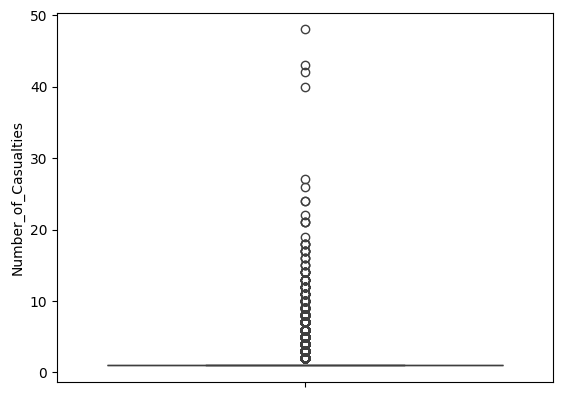

In [62]:
sns.boxplot(data['Number_of_Casualties'])
plt.show()

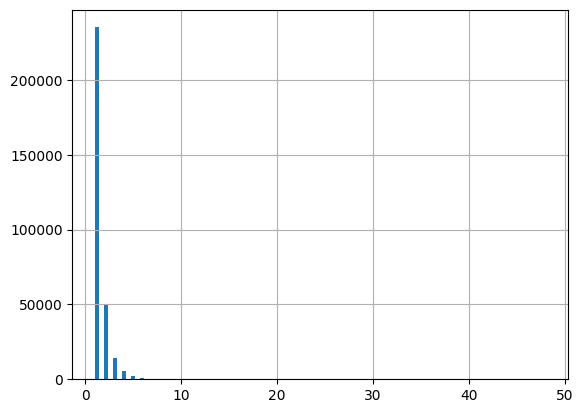

In [63]:
data['Number_of_Casualties'].hist(bins = 100)
plt.show()

In [71]:
severity = [[data['Accident_Severity'].values]]
print(severity)

[[array(['Serious', 'Serious', 'Slight', ..., 'Slight', 'Serious',
       'Serious'], dtype=object)]]


## Exploratory Data Analysis

In this phase useful information will be sought from the dataset by way of graphs and other coding tools. 

In [82]:

df = px.data.tips()
fig = px.scatter(df,y=data['Number_of_Casualties'], x = data['Accident Date'], color=data["Number_of_Casualties"])
fig.update_layout(title = 'Distribution of accidents over time',
                  yaxis_title = 'Casualties',
                  xaxis_title = 'Dates')

fig.show()

From the graph above, many accidents have low casualties, but there are some that lead to high casualties, lower than 50, but significantly big casualties nonetheless. 

In [88]:
# Ensure 'Accident Date' is in datetime format
data['Accident Date'] = pd.to_datetime(data['Accident Date'])

# Aggregate casualties by date
casualties_trend = data.groupby('Accident Date')['Number_of_Casualties'].sum().reset_index()

# Create the line graph
fig = px.line(casualties_trend, 
              x="Accident Date", 
              y="Number_of_Casualties", 
              title="Trend of Casualties Over Time")

# Label axes
fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Number of Casualties"
)

# Show the figure
fig.show()

From the above data there was a steady rise of number of casualties inaccidents up until January 2022 where a sharp decline was witnessed. Thereafter, there was a slight rise up untill November 2022 where there was another decline in numbers. 